# Part 1: Data Collection (Independent Variables)

In [1]:
# Extract data from 2013 to 2015 (for all 12 months) from https://en.tutiempo.net/climate/01-2013/ws-421820.html

# ~30 days * 12 months * 3 years = ~1080 rows of data

# From the above link, every page will give data for one month. 
# Hence we need to alter the month and year in the URL to fetch data for all the years and months

In [2]:
# Collecting and saving the html files in local storage

In [3]:
from bs4 import BeautifulSoup as bs
import requests
import pandas as pd
import pandas_profiling as pp
import numpy as np
import os
import time
import warnings
warnings.filterwarnings('ignore')

In [4]:
import time
import random
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import norm
from sklearn.preprocessing import StandardScaler   # same as preprocessing.scale(data)
from scipy import stats
import warnings
warnings.filterwarnings('ignore')
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn import preprocessing
from sklearn.preprocessing import label_binarize
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.svm import SVC
from sklearn import metrics, tree
from sklearn.model_selection import KFold, cross_val_score
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier 
from sklearn.ensemble import RandomForestRegressor 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB, BernoulliNB, GaussianNB
from IPython.display import Image  
from sklearn.tree import export_graphviz
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
from yellowbrick.classifier import ROCAUC, roc_auc
from yellowbrick.features import RadViz
import pydotplus
from urllib.request import urlopen 
from itertools import cycle
%matplotlib inline
plt.style.use('ggplot')
pd.set_option('display.max_columns', 500) 

In [5]:
def retrieve_html(start_year, end_year):
    for year in range (start_year, end_year+1):
        for month in range (1, 13):
            if month<10:
                url = f'https://en.tutiempo.net/climate/0{month}-{year}/ws-421820.html'
            else:
                url = f'https://en.tutiempo.net/climate/{month}-{year}/ws-421820.html'
                
            data = requests.get(url, verify = False).text

            # Create Directory Structure to save the html files
            if not os.path.exists(f'Data/html_data/{year}'): 
                os.makedirs(f'Data/html_data/{year}')

            # File Handling - Save all the html data as html files
            if month<10:
                with open(f'Data/html_data/{year}/0{month}.html', 'w') as f:
                    f.write(data)
            else:
                with open(f'Data/html_data/{year}/{month}.html', 'w') as f:
                    f.write(data)

In [6]:
# Create a folder structure to store the data so that we can work offline:

# data
#     - html_data
#                - 2013
#                      - 01.html
#                      - 02.html
#                      - 03.html

In [7]:
# # Call function to retrieve HTML data from the url. Comment it out afterwards.
# # Note: Internet connection is needed to execute this:

# start_time = time.time()
# retrieve_html(2013, 2015)
# end_time = time.time()
# print("Done, Total Time: ", end_time - start_time)

# Part 2: Collecting Target Variable

In [8]:
# Next, refer to AQI data in Data\AQI\aqi2013.csv, aqi2014.csv, aqi2015.csv
# This file has hourly data. We need to take the mean of hourly data to fetch daily data
# We need to treat the missing values as well

In [9]:
average = []

def avg_data(path):    
    # Read the data
    for rows in pd.read_csv(path, chunksize = 24):  # chunksize defines number of rows to be read at a time (24 means 24 hours)
        add_var = 0
        n = 0
        data1 = []
        df = pd.DataFrame(data = rows)
        #print(df)

        for _, row in df.iterrows():      # Tuple unpacking: _, row --> row has the 2nd item separated from the 1st value by ','
                                          # We use _ to save memory by not assigning the 1st value to any variable
            data1.append(row['PM2.5'])    # We need only the data in series 'PM2.5'    
            date = row['Date']
        #print(date, data1)

        for i in data1:
            if type(i) is float or type(i) is int:
                add_var += i
                n += 1

            elif type(i) is str:
                if i != 'NoData' and i != 'PwrFail' and i != '---' and i != 'InVld':
                    add_var += float(i)
                    n += 1

        if n==0:                     # n is the number of valid values for each date which may or may not be 24
            n = 1                    # Change the value of n to 1 if it is 0 to avoid Zero Division Error
            
        average.append((date.split()[0], add_var/n))    # The division should be by the actual number of values available for that day and not by 24 as there are missing values


#     print("Number of days for which data is available: ", len(average))
#     print(average)               

In [10]:
# Call the above function for all values of 'year' in the required range

target = []
c = 2013
for _, _, files in os.walk('Data/AQI/'):
    for file in files:        
        if file.endswith(".csv"):
            pth = 'Data/AQI/' + file
            print(pth)
            avg_data(pth)
            c = c + 1

#print("\n", average)

Data/AQI/aqi2013.csv
Data/AQI/aqi2014.csv
Data/AQI/aqi2015.csv


In [11]:
final_target = pd.DataFrame(average, index = None, columns = ['Date', 'PM2.5'])
final_target.to_csv('TV.csv')
final_target

,Date,PM2.5
0,01/01/2013,284.795833
1,02/01/2013,239.695455
2,03/01/2013,182.187500
3,04/01/2013,197.635714
4,05/01/2013,0.000000
...,...,...
1089,27/12/2015,255.333333
1090,28/12/2015,199.916667
1091,29/12/2015,190.500000
1092,30/12/2015,217.727273


# Part 3: Read and Consolidate the Independent Variables

In [12]:
df_res = pd.DataFrame()
# Extract all the folder names in the directory 'Data\\html_data\\':
for _, dirs, _ in os.walk('Data\\html_data\\'):
    break

# Extract all the file names in each folder:
for sub_dir in dirs:
    for _, _, files in os.walk('Data\\html_data\\' + sub_dir):
        for file in files:
            path = os.path.join('Data\\html_data\\', sub_dir, file)
            #print(path)            
            
            with open(path, 'r') as page:
                soup = bs(page)
                table = soup.find('table', {'class':'medias mensuales numspan'})
                
                daily_data = []
                for rows in table.find_all('td'):  
                    daily_data.append(rows.text)
                    
                res_daily_data = []
                daily = []
                n = 0

                for val in daily_data:
                    if n<=13:
                        n = n + 1
                        res_daily_data.append(val)
                        
                    else:
                        daily.append(res_daily_data)
                        res_daily_data = []
                        n = 0
                        continue
                
                df = pd.DataFrame(daily, index = None, columns = ['Day', 
                                                                  'Average Temperature',
                                                                  'Maximum temperature',
                                                                  'Minimum temperature', 
                                                                  'Atmospheric pressure at sea level (hPa)', 
                                                                  'Average relative humidity', 
                                                                  'Total rainfall and / or snowmelt (mm)', 
                                                                  'Average visibility (Km)', 
                                                                  'Average wind speed (Km/h)', 
                                                                  'Maximum sustained wind speed (Km/h)', 
                                                                  'VG', 'RA', 'SN', 'TS'])
                
                df['Day'] = df['Day'].astype(str).str.zfill(2)
                df['Date'] = df['Day'] + '/' + file.split('.')[0] + '/' + sub_dir
                df = df[:-1]
                df = df[['Date', 
                         'Average Temperature',
                         'Maximum temperature',
                         'Minimum temperature', 
                         'Atmospheric pressure at sea level (hPa)', 
                         'Average relative humidity', 
                         'Total rainfall and / or snowmelt (mm)', 
                         'Average visibility (Km)', 
                         'Average wind speed (Km/h)', 
                         'Maximum sustained wind speed (Km/h)', 
                         'VG', 'RA', 'SN', 'TS']]
                #print (df)
                df_res = df_res.append(df)
                
final_features = df_res.iloc[:, :10] 
final_features.to_csv('independent_variables.csv', index = None)
final_features.head(10)

,Date,Average Temperature,Maximum temperature,Minimum temperature,Atmospheric pressure at sea level (hPa),Average relative humidity,Total rainfall and / or snowmelt (mm),Average visibility (Km),Average wind speed (Km/h),Maximum sustained wind speed (Km/h)
0,01/01/2013,9.1,15.3,4,1015.6,90,0,0.5,0,-
1,02/01/2013,7.4,9.8,4.8,1017.6,93,0,0.5,4.3,9.4
2,03/01/2013,7.8,12.7,4.4,1018.5,87,0,0.6,4.4,11.1
3,04/01/2013,,,,,,,,,
4,05/01/2013,,,,,,,,,
5,06/01/2013,,,,,,,,,
6,07/01/2013,6.7,13.4,2.4,1019.4,82,0,0.6,4.8,11.1
7,08/01/2013,8.6,15.5,3.3,1018.7,72,0,0.8,8.1,20.6
8,09/01/2013,12.4,20.9,4.4,1017.3,61,0,1.3,8.7,22.2
9,10/01/2013,,,,,,,,,


# Part 4: Merge the Independent and Dependent Variables into a single DataFrame

In [13]:
final_df = pd.merge(final_features, final_target, on ='Date', how ='inner')  # Perform Inner Join (similar to vlookup in excel)
final_df.head(10)

,Date,Average Temperature,Maximum temperature,Minimum temperature,Atmospheric pressure at sea level (hPa),Average relative humidity,Total rainfall and / or snowmelt (mm),Average visibility (Km),Average wind speed (Km/h),Maximum sustained wind speed (Km/h),PM2.5
0,01/01/2013,9.1,15.3,4,1015.6,90,0,0.5,0,-,284.795833
1,02/01/2013,7.4,9.8,4.8,1017.6,93,0,0.5,4.3,9.4,239.695455
2,03/01/2013,7.8,12.7,4.4,1018.5,87,0,0.6,4.4,11.1,182.187500
3,04/01/2013,,,,,,,,,,197.635714
4,05/01/2013,,,,,,,,,,0.000000
5,06/01/2013,,,,,,,,,,297.100000
6,07/01/2013,6.7,13.4,2.4,1019.4,82,0,0.6,4.8,11.1,264.064286
7,08/01/2013,8.6,15.5,3.3,1018.7,72,0,0.8,8.1,20.6,223.208333
8,09/01/2013,12.4,20.9,4.4,1017.3,61,0,1.3,8.7,22.2,200.645833
9,10/01/2013,,,,,,,,,,154.875000


# Replace Null and Zero Values with Median Value

In [14]:
# Replace empty cells in 'Average Temperature' column with NAN and drop those rows:
final_df['Average Temperature'].replace('', np.nan, inplace = True)
final_df.dropna(subset=['Average Temperature'], inplace=True)

# Replace values '-' with NAN
final_df.replace('-', np.nan, inplace = True)

# Replace values 0 with NAN
final_df.replace(0, np.nan, inplace = True)

# Replace all NAN Values with median value for all columns
final_df = final_df.fillna(final_df.median())

In [15]:
# Check for NaN Values:
final_df.isnull().values.any()

False

# Exploratory Data Analysis

In [17]:
final_df = final_df.drop(['Date'], axis = 1)
final_df = final_df.astype(float)
final_df['PM2.5'] = final_df['PM2.5'].astype(int)
final_df.dtypes

Average Temperature                        float64
Maximum temperature                        float64
Minimum temperature                        float64
Atmospheric pressure at sea level (hPa)    float64
Average relative humidity                  float64
Total rainfall and / or snowmelt (mm)      float64
Average visibility (Km)                    float64
Average wind speed (Km/h)                  float64
Maximum sustained wind speed (Km/h)        float64
PM2.5                                        int32
dtype: object

In [18]:
report = pp.ProfileReport(final_df)
report.to_file('Data/profile_report.html')
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

# Convert Target Variable to Categorical

In [18]:
# If PM2.5 is between 0   to 30  , categorize it as 0
# If PM2.5 is between 30  to 100 , categorize it as 1
# If PM2.5 is between 100 to 250 , categorize it as 2
# If PM2.5 is between 250 to 600 , categorize it as 3

final_df['PM2.5'] = np.where(final_df['PM2.5'].between(0,30), 0, final_df['PM2.5'])
final_df['PM2.5'] = np.where(final_df['PM2.5'].between(30,100), 1, final_df['PM2.5'])
final_df['PM2.5'] = np.where(final_df['PM2.5'].between(100,250), 2, final_df['PM2.5'])
final_df['PM2.5'] = np.where(final_df['PM2.5'].between(250,600), 3, final_df['PM2.5'])

In [19]:
final_df['PM2.5'] = final_df['PM2.5'].astype(int)

In [20]:
categories = dict(final_df['PM2.5'].value_counts())
categories = list(categories.keys())
categories = sorted(categories, key=int, reverse=False)
categories = list(map(str, categories))
categories

['0', '1', '2', '3']

In [21]:
final_df

,Average Temperature,Maximum temperature,Minimum temperature,Atmospheric pressure at sea level (hPa),Average relative humidity,Total rainfall and / or snowmelt (mm),Average visibility (Km),Average wind speed (Km/h),Maximum sustained wind speed (Km/h),PM2.5
0,9.1,15.30,4.00,1015.6,90.0,0.0,0.5,0.0,14.8,3
1,7.4,9.80,4.80,1017.6,93.0,0.0,0.5,4.3,9.4,2
2,7.8,12.70,4.40,1018.5,87.0,0.0,0.6,4.4,11.1,2
6,6.7,13.40,2.40,1019.4,82.0,0.0,0.6,4.8,11.1,3
7,8.6,15.50,3.30,1018.7,72.0,0.0,0.8,8.1,20.6,2
...,...,...,...,...,...,...,...,...,...,...
1080,13.7,21.00,5.60,1018.8,71.0,0.0,1.3,1.5,7.6,3
1084,13.3,19.30,5.50,1021.9,62.0,0.0,1.9,7.8,14.8,2
1085,14.4,21.50,5.50,1021.0,60.0,0.0,1.8,8.9,18.3,2
1086,16.3,22.50,7.60,1020.6,64.0,0.0,1.4,8.1,14.8,3


In [22]:
# Save the final dataframe as a csv file for later reference
final_df.to_csv('Data/cleaned_data.csv', index = None)
final_df.head()

,Average Temperature,Maximum temperature,Minimum temperature,Atmospheric pressure at sea level (hPa),Average relative humidity,Total rainfall and / or snowmelt (mm),Average visibility (Km),Average wind speed (Km/h),Maximum sustained wind speed (Km/h),PM2.5
0,9.1,15.3,4.0,1015.6,90.0,0.0,0.5,0.0,14.8,3
1,7.4,9.8,4.8,1017.6,93.0,0.0,0.5,4.3,9.4,2
2,7.8,12.7,4.4,1018.5,87.0,0.0,0.6,4.4,11.1,2
6,6.7,13.4,2.4,1019.4,82.0,0.0,0.6,4.8,11.1,3
7,8.6,15.5,3.3,1018.7,72.0,0.0,0.8,8.1,20.6,2


# Plot Correlation Matrix to visualize the degree of Correlation between variables

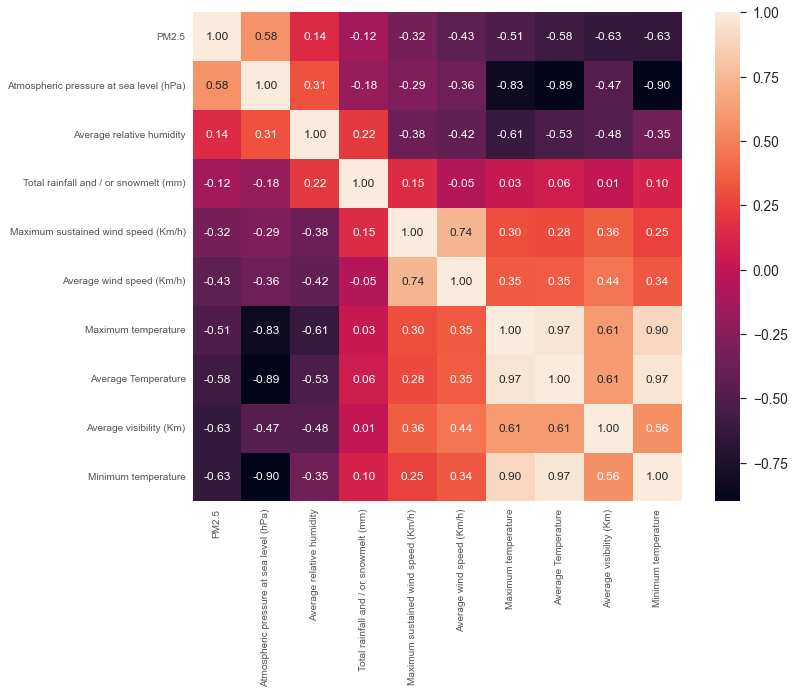

In [23]:
# Create Correlation Matrix
corrmat = final_df.corr()

# Attrition correlation matrix
k = 10 # Number of variables for heatmap
cols = corrmat.nlargest(k, 'PM2.5')['PM2.5'].index

# Correlation Matrix
cm = np.corrcoef(final_df[cols].values.T)
f, ax = plt.subplots(figsize=(12, 9))
sns.set(font_scale=1.25)

# Plot the Heatmap
hm = sns.heatmap(cm, cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 12}, 
                 yticklabels=cols.values, xticklabels=cols.values)
plt.show()

In [24]:
# For Classification using Random Forest Classifier, we are not dropping any of the correlated variables as Random Forest
# is not sensitive to Multicollinearity

# final_df = final_df.drop(['Minimum temperature'], axis = 1)
# final_df = final_df.drop(['Maximum temperature'], axis = 1)
# final_df = final_df.drop(['Average Temperature'], axis = 1)
# final_df = final_df.drop(['Atmospheric pressure at sea level (hPa)'], axis = 1)
# final_df = final_df.drop(['Maximum sustained wind speed (Km/h)'], axis = 1)
# final_df = final_df.drop(['Total rainfall and / or snowmelt (mm)'], axis = 1)

In [25]:
# # Create Correlation Matrix
# corrmat = final_df.corr()

# # Attrition correlation matrix
# k = 8 # Number of variables for heatmap
# cols = corrmat.nlargest(k, 'PM2.5')['PM2.5'].index

# # Correlation Matrix
# cm = np.corrcoef(final_df[cols].values.T)
# f, ax = plt.subplots(figsize=(12, 9))
# sns.set(font_scale=1.25)

# # Plot the Heatmap
# hm = sns.heatmap(cm, cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 12}, 
#                  yticklabels=cols.values, xticklabels=cols.values)
# plt.show()

# Scaling & Standardization

In [26]:
# Save the Target Variable "quality" in variable y before standardization as Target Variable should not be standardised
y = final_df.iloc[:, final_df.columns == 'PM2.5']

In [27]:
cols = list(final_df.columns)
l = len(cols)-1
cols = cols[0:l]

data = final_df.drop('PM2.5', axis = 1).values  

#standardize the data to normal distribution
dataset1_standardized = preprocessing.scale(data)
encoded_df1 = pd.DataFrame(dataset1_standardized, columns = cols)    # encoded_df1 is the dataset without the target variable
#encoded_df1.head(20)

In [28]:
# Save the standardised values of variables in x
x = encoded_df1.values

# Train Test Split

In [29]:
# Split the dataset for training and testing

x_train1, x_test1, y_train1, y_test1 = train_test_split(x, y, test_size = 0.1, random_state = 42)
# Cleaning test sets to avoid future warning messages
# y_train1 = y_train1.values.ravel() 
# y_test1 = y_test1.values.ravel() 

# Function to plot Classification Report

In [30]:
# Function to print Classification Report. Callable in future from all models

def print_class_report(predictions, y_t, target, alg_name):

    print('Classification Report for {0}:'.format(alg_name))
    print(classification_report(predictions, y_t, target_names = target))

# +++++++++++++++++++++++++++++++++++++++++++++++++++++

# Random Forest Classifier Model

In [31]:
# Random Forest Classifier: Set the random state for reproducibility
fit_rf = RandomForestClassifier(random_state=42)

# Hyper-Parameter Optimization using GridSearchCV (Cross Validation)

In [32]:
# # Execute this code snippet only to find the optimal values of parameters. Comment it out afterwards
# # Automatically find the best parameters instead of manual hit and try

# np.random.seed(42)
# start = time.time()

# param_dist = {'max_depth': [8, 9, 10, 11, 12, 14, 16],
#               'max_features': ['auto', None],
#               'criterion': ['gini', 'entropy'],
#               'min_samples_split' : [3, 4, 5, 6, 7, 8, 9],
#               'min_samples_leaf' : [2, 3, 4, 5, 6, 7, 8, 9]}

# cv_rf = GridSearchCV(fit_rf, cv = 5, param_grid=param_dist, n_jobs = -1)                 

# cv_rf.fit(x_train1, y_train1)
# print('Best Parameters using grid search: \n', cv_rf.best_params_)
# end = time.time()
# print('Time taken in grid search: {0: .2f}'.format(end - start))

# OOB (Out of Bag) Error Rate

In [33]:
# # OOB: Rows / Columns that are not included in a certain random sample. 
# # The model has no visibility to such records in that particular decision tree being created
# # as they are not exposed to that data

# fit_rf.set_params(warm_start=False, oob_score=True)
 
# min_estimators = 50
# max_estimators = 1500

# error_rate = {}
# for i in range(min_estimators, max_estimators + 1):
#     fit_rf.set_params(n_estimators=i)
#     fit_rf.fit(x_train1, y_train1)
#     oob_error = 1 - fit_rf.oob_score_
#     error_rate[i] = oob_error
    
# # Convert dictionary to a pandas series for easy plotting 
# oob_series = pd.Series(error_rate)
    
# fig, ax = plt.subplots(figsize=(25, 6))

# ax.set_facecolor('#fafafa')
# oob_series.plot(kind='line',color = 'red')
# plt.xlabel('n_estimators')
# plt.ylabel('OOB Error Rate')
# plt.title('OOB Error Rate Across various Forest sizes \n(From 15 to 500 trees)')
# plt.grid(color = 'blue', linestyle = '--', linewidth = 0.5)

In [34]:
# print('OOB Error rate for 350 trees is: {0:.5f}'.format(oob_series[355]))
# #OOB Error rate for 350 trees is: 0.29888

In [35]:
# # Set best parameters given by grid search CV

# temp = []

# for md in range(9,13):
#     for cri in ['entropy', 'gini']:
#         for mss in range(2,10):
#             for msl in range(2,6):
#                 for mf in ['auto', None]:    
#                     for ml in range(100, 200, 10):
#                         fit_rf.set_params(max_depth=md, 
#                                             criterion=cri, 
#                                             min_samples_split=mss, 
#                                             min_samples_leaf=msl, 
#                                             max_features = mf,
#                                             max_leaf_nodes = ml,
#                                             n_estimators=355,
#                                             bootstrap = True,
#                                             warm_start=False, 
#                                             oob_score=True)
                    
#                         # Train the Random Forest
#                         fit_rf.fit(x_train1, y_train1)

#                         model_rf_score_train = fit_rf.score(x_train1, y_train1)
#                         model_rf_score_test = fit_rf.score(x_test1, y_test1)

#                         tpl = (model_rf_score_test.round(4), md, cri, mss, msl, mf, ml)
#                         temp.append(tpl)

#                         if model_rf_score_test >= 0.724:
#                             print("Accuracy = ", model_rf_score_test.round(4), md, cri, mss, msl, mf, ml) 
                        
# temp

In [36]:
# Refine the tree via OOB Output for n_estimators
# n_estimators is the number of trees we want to build before taking the maximum voting or averages of predictions
# Set best parameters given by grid search 

fit_rf.set_params(max_depth=9, 
                  criterion="entropy", 
                  min_samples_split=9, 
                  min_samples_leaf=4, 
                  max_features = None,
                  n_estimators=355,
                  max_leaf_nodes = 40,
                  bootstrap = True,
                  warm_start=False, 
                  oob_score=True)

# Train the Random Forest
fit_rf.fit(x_train1, y_train1)

model_rf_score_train = fit_rf.score(x_train1, y_train1)
print("Training score: ", model_rf_score_train)

model_rf_score_test = fit_rf.score(x_test1, y_test1)
print("Testing score: ",model_rf_score_test)

Training score:  0.874251497005988
Testing score:  0.75


# Predictions & Evaluations (Confusion Matrix and Classification Report)

In [37]:
y_pred_rf = fit_rf.predict(x_test1)

In [38]:
accuracy_rf = metrics.accuracy_score(y_test1, y_pred_rf)
Precision_rf = metrics.precision_score(y_test1, y_pred_rf,average='weighted')
recall_rf = metrics.recall_score(y_test1, y_pred_rf,average='weighted')

print("Accuracy:",accuracy_rf)
print("Precision (Weighted Average):",Precision_rf)
print("Recall (Weighted Average):",recall_rf)

Accuracy: 0.75
Precision (Weighted Average): 0.7255051691729324
Recall (Weighted Average): 0.75


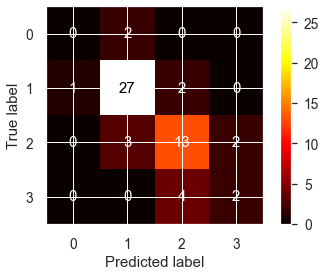

In [39]:
# Call Confusion Matrix Plotting function
# print(confusion_matrix(y_test1, y_pred_rf))
plot_confusion_matrix(fit_rf, x_test1, y_test1, cmap='hot', labels=[0,1,2,3])

# Accuracy & Error Rate

In [40]:
model_rf_score_train = fit_rf.score(x_train1, y_train1)
print("Training score: ", model_rf_score_train)

model_rf_score_test = fit_rf.score(x_test1, y_test1)
print("Testing score: ",model_rf_score_test)

Training score:  0.874251497005988
Testing score:  0.75


# Area Under Curve (AUC)

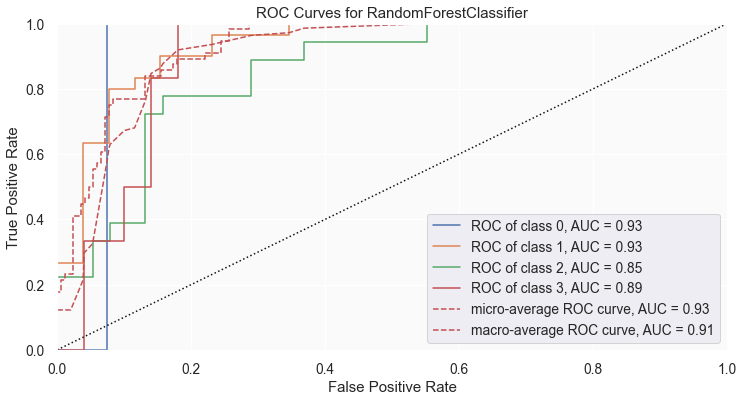

<AxesSubplot:title={'center':'ROC Curves for RandomForestClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [41]:
# Plot AUC

fig, ax = plt.subplots(figsize=(12, 6))
ax.set_facecolor('#fafafa')
visualizer = ROCAUC(fit_rf, ax)
visualizer.fit(x_train1, y_train1)        # Fit the training data to the visualizer
auc_rf = visualizer.score(x_test1, y_test1)        # Evaluate the model on the test data
visualizer.show()                       # Finalize and render the figure

In [42]:
# Call functiont to print Classification Report
class_report = print_class_report(y_pred_rf, y_test1, ['0','1','2','3'], 'Random Forest')

Classification Report for Random Forest:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.90      0.84      0.87        32
           2       0.72      0.68      0.70        19
           3       0.33      0.50      0.40         4

    accuracy                           0.75        56
   macro avg       0.49      0.51      0.49        56
weighted avg       0.78      0.75      0.76        56



# -+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+

# Support Vector Machines (SVM)

In [43]:
# Split the dataset for training and testing

x_train3, x_test3, y_train3, y_test3 = train_test_split(x, y, test_size = 0.2, random_state = 42)
# Cleaning test sets to avoid future warning messages
y_train3 = y_train3.values.ravel() 
y_test3 = y_test3.values.ravel() 

# Kernel Parameter

In [44]:
# Execute this code snippet only to find the optimal values of parameters. Comment it out afterwards
# Linear Kernel:
svc=SVC(kernel='linear')
svc.fit(x_train3,y_train3)
y_pred_svm=svc.predict(x_test3)
print('\nAccuracy Score for Linear Kernel: ', metrics.accuracy_score(y_test3,y_pred_svm))

# Polynomial Kernel:
svc=SVC(kernel='poly')
svc.fit(x_train3,y_train3)
y_pred_svm=svc.predict(x_test3)
print('Accuracy Score for Polynomial Kernel: ', metrics.accuracy_score(y_test3,y_pred_svm))

# rbf Kernel:
svc=SVC(kernel='rbf')
svc.fit(x_train3,y_train3)
y_pred_svm=svc.predict(x_test3)
print('Accuracy Score for rbf Kernel: ', metrics.accuracy_score(y_test3,y_pred_svm))

# sigmoid Kernel:
svc=SVC(kernel='sigmoid')
svc.fit(x_train3,y_train3)
y_pred_svm=svc.predict(x_test3)
print('Accuracy Score for sigmoid Kernel: ', metrics.accuracy_score(y_test3,y_pred_svm))

# Insights: 'Linear' kernel gives the best accuracy


Accuracy Score for Linear Kernel:  0.7410714285714286
Accuracy Score for Polynomial Kernel:  0.6964285714285714
Accuracy Score for rbf Kernel:  0.7232142857142857
Accuracy Score for sigmoid Kernel:  0.5892857142857143


# Optimizing Hyper Parameter C

In [45]:
# # Execute this code snippet only to find the optimal values of parameters. Comment it out afterwards
# # Optimizing the HyperParameter C

# C_range=list(range(1,40,1))
# acc_score=[]
# for c in C_range:
#     svc = SVC(kernel='linear', C=c)
#     scores = cross_val_score(svc, x_train3, y_train3, cv=10, scoring='accuracy', n_jobs = -1)
#     acc_score.append(scores.mean())
# print(acc_score)
# ind = acc_score.index(max(acc_score))
# print("\nOptimal Integer Value of C =", C_range[ind])

# # plot the value of C for SVM (x-axis) versus the cross-validated accuracy (y-axis)
# C_values=list(range(1,40))
# plt.plot(C_values,acc_score)
# plt.xticks(np.arange(0,42,4))
# plt.xlabel('Value of C for SVC')
# plt.ylabel('Cross-Validated Accuracy')

In [46]:
# # Execute this code snippet only to find the optimal values of parameters. Comment it out afterwards
# # Find the exact value of C up to 1 place of decimal

# C_range=list(np.arange(8, 12, 0.05))
# acc_score=[]
# for c in C_range:
#     svc = SVC(kernel='linear', C=c)
#     scores = cross_val_score(svc, x_train3, y_train3, cv=10, scoring='accuracy', n_jobs = -1)
#     acc_score.append(scores.mean())
 
# # plot the value of C for SVM (x-axis) versus the cross-validated accuracy (y-axis)
# C_values=list(np.arange(8,12,0.05))
# plt.figure(figsize = (20,6))
# plt.plot(C_values,acc_score)
# plt.xticks(np.arange(8,12,0.2))
# plt.xlabel('Value of C for SVC ')
# plt.ylabel('Cross-Validated Accuracy')

# # Insights: Optimal value of C - Hyperparameter is: 10

# Optimizing Hyper Parameter Gamma

In [47]:
# # Execute this code snippet only to find the optimal values of parameters. Comment it out afterwards
# # Optimizing the HyperParameter Gamma

# gamma_range=[0.0001, 0.001, 0.01, 0.1, 0.5, 1, 10, 100, 1000]
# acc_score=[]
# for g in gamma_range:
#     svc = SVC(kernel='linear', gamma=g)
#     scores = cross_val_score(svc, x_train3, y_train3, cv=10, scoring='accuracy', n_jobs = -1)
#     acc_score.append(scores.mean())
# print(acc_score)  

# # plot the value of C for SVM (x-axis) versus the cross-validated accuracy (y-axis)
# gamma_range=[0.0001, 0.001, 0.01, 0.1, 0.5, 1, 10, 100, 1000]
# plt.figure(figsize = (20,6))
# plt.plot(gamma_range,acc_score)
# plt.xlabel('Value of gamma for SVC ')
# plt.xticks(np.arange(0,1000,50))
# plt.ylabel('Cross-Validated Accuracy')

# # Insights: Optimal value of Gamma - Hyperparameter is: Any value as it's a linear data

# Hyper-Parameter Optimization using GridSearchCV (Cross Validation)

In [48]:
# Execute this code snippet only to find the optimal values of parameters. Comment it out afterwards
# Automatically find the best parameters instead of manual hit and try

svm_model= SVC()
tuned_parameters = {'C': (np.arange(8,12,0.05)), 
                    'gamma': [0.1], 
                    'kernel':['linear'], 
                    'degree': [1, 2, 3, 4]}

fit_svm = GridSearchCV(svm_model, tuned_parameters, cv=10, scoring='accuracy', n_jobs = -1)
fit_svm.fit(x_train3, y_train3)
print("Accuracy: ", fit_svm.best_score_)
print("Parameters: ", fit_svm.best_params_)

Accuracy:  0.7035858585858585
Parameters:  {'C': 9.250000000000018, 'degree': 1, 'gamma': 0.1, 'kernel': 'linear'}


# Support Vector Machine (SVM) Classifier

In [49]:
svm_model= SVC(probability=True)
tuned_parameters = {'C': [9.25] , 'kernel': ['linear'], 'gamma': [0.1], 'degree': [1]}

fit_svm = GridSearchCV(svm_model, tuned_parameters, cv=10, scoring='accuracy', n_jobs = -1)
fit_svm.fit(x_train3, y_train3)
print("Accuracy: ", fit_svm.best_score_)
print("Parameters: ", fit_svm.best_params_)

Accuracy:  0.7035858585858585
Parameters:  {'C': 9.25, 'degree': 1, 'gamma': 0.1, 'kernel': 'linear'}


# Predictions & Evaluations (Confusion Matrix and Classification Report)

In [50]:
y_pred_svm = fit_svm.predict(x_test3)

In [51]:
accuracy_svm = metrics.accuracy_score(y_test3, y_pred_svm)
Precision_svm = metrics.precision_score(y_test3, y_pred_svm,average='weighted')
recall_svm = metrics.recall_score(y_test3, y_pred_svm,average='weighted')

print("Accuracy:",accuracy_svm)
print("Precision (Weighted Average):",Precision_svm)
print("Recall (Weighted Average):",recall_svm)

Accuracy: 0.7232142857142857
Precision (Weighted Average): 0.696382783882784
Recall (Weighted Average): 0.7232142857142857


[[ 1  6  0  0]
 [ 1 53  2  0]
 [ 0  6 25  7]
 [ 0  0  9  2]]


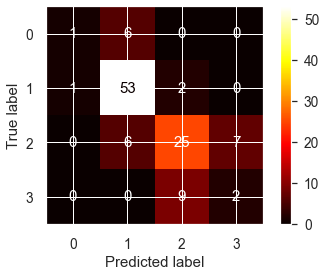

In [52]:
# Call Confusion Matrix Plotting function
print(confusion_matrix(y_test3, y_pred_svm))
plot_confusion_matrix(fit_svm, x_test3, y_test3, cmap='hot')

# Accuracy and Error Rate

In [53]:
model_svm_score_train = fit_svm.score(x_train3, y_train3)
print("Training score: ", model_svm_score_train)

model_svm_score_test = fit_svm.score(x_test3, y_test3)
print("Testing score: ",model_svm_score_test)

Training score:  0.7325842696629213
Testing score:  0.7232142857142857


# Area Under Curve (AUC)

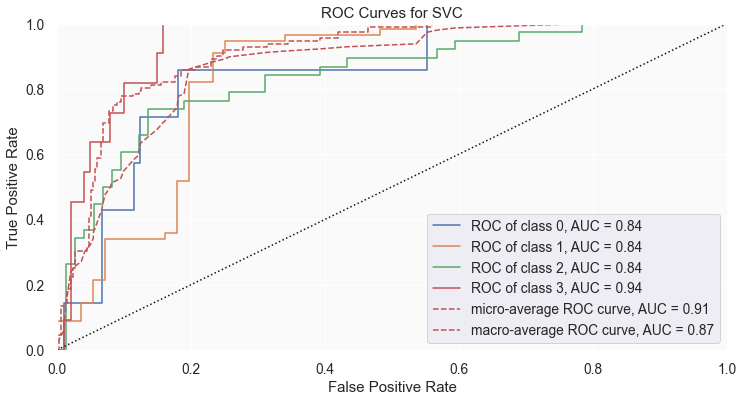

<AxesSubplot:title={'center':'ROC Curves for SVC'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [54]:
fig, ax = plt.subplots(figsize=(12, 6))
ax.set_facecolor('#fafafa')
visualizer = ROCAUC(svm_model, ax)
visualizer.fit(x_train3, y_train3)        # Fit the training data to the visualizer
auc_svm = visualizer.score(x_test3, y_test3)        # Evaluate the model on the test data
visualizer.show()                       # Finalize and render the figure

In [55]:
# Print Classification Report:

class_report = print_class_report(y_pred_svm, y_test3, categories, 'Support Vector Machines')
# f1 Score = 2 * (precision * recall)/ (precision + recall) ie how good my model is in predicting 1 as 1 and 0 as 0

Classification Report for Support Vector Machines:
              precision    recall  f1-score   support

           0       0.14      0.50      0.22         2
           1       0.95      0.82      0.88        65
           2       0.66      0.69      0.68        36
           3       0.18      0.22      0.20         9

    accuracy                           0.72       112
   macro avg       0.48      0.56      0.49       112
weighted avg       0.78      0.72      0.75       112



# Precision, Accuracy and AUC Comparison Between Models

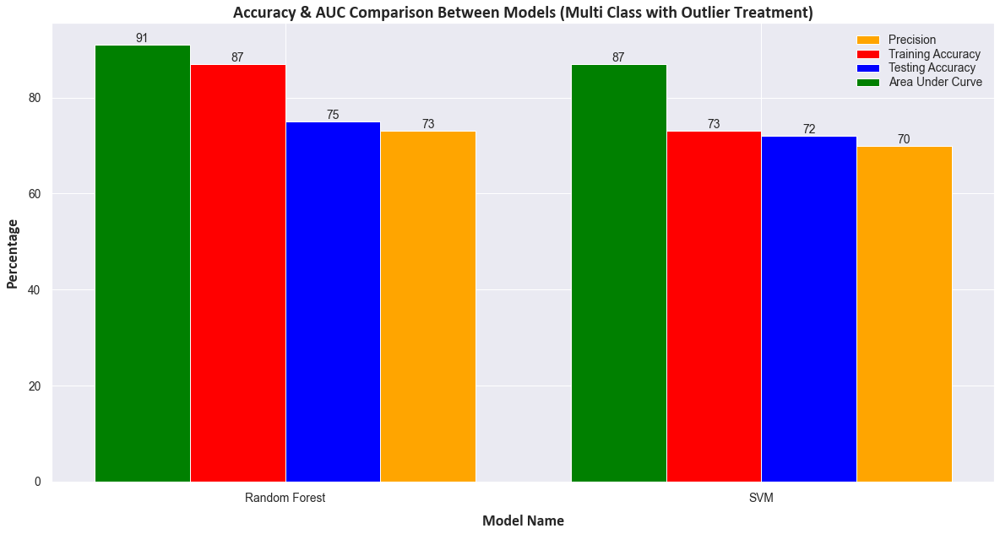

In [56]:
# Create a list of tuples with Mean Test Accuracy of all models:
acc_comparison_test = [('Random Forest', (model_rf_score_test*100).round()), 
                       ('SVM', (model_svm_score_test*100).round())]
acc_comparison_test = dict(acc_comparison_test)

# Create a list of tuples with Mean Train Accuracy of all models:
acc_comparison_train = [('Random Forest', (model_rf_score_train*100).round()), 
                        ('SVM', (model_svm_score_train*100).round())]
acc_comparison_train = dict(acc_comparison_train)

# Create a list of tuples with Area Under Curve of all models:
auc_comparison = [('Random Forest', (auc_rf*100).round()), 
                  ('SVM', (auc_svm*100).round())]
auc_comparison = dict(auc_comparison)

# Create a list of tuples with Area Under Curve of all models:
prc_comparison = [('Random Forest', (Precision_rf*100).round()), 
                  ('SVM', (Precision_svm*100).round())]
prc_comparison = dict(prc_comparison)

# Plot a bar graph to compare the result
fig = plt.figure(figsize = (20,10))
X_axis = np.arange(len(acc_comparison_test.keys()))  

plt.bar(X_axis + 0.3, prc_comparison.values(), 0.2, color = "Orange", label = "Precision")
plt.bar(X_axis - 0.1, acc_comparison_train.values(), 0.2, color = "Red", label = "Training Accuracy")
plt.bar(X_axis + 0.1, acc_comparison_test.values(), 0.2, color = "Blue", label = "Testing Accuracy")
plt.bar(X_axis - 0.3, auc_comparison.values(), 0.2, color = "Green", label = "Area Under Curve")

# Add Labels
plt.xticks(X_axis, acc_comparison_train.keys())
plt.title("Accuracy & AUC Comparison Between Models (Multi Class with Outlier Treatment)", fontsize=20, fontweight='bold', fontname='calibri')
plt.xlabel("Model Name", fontsize=18, labelpad=12, fontweight='bold', fontname='calibri')
plt.ylabel("Percentage", fontsize=18, labelpad=10, fontweight='bold', fontname='calibri')

lst1 = list(acc_comparison_train.values())
lst2 = list(acc_comparison_test.values())
model_lst = list(acc_comparison_train.keys())
lst3 = list(auc_comparison.values())
lst4 = list(prc_comparison.values())

# Annotate the bars with values
for i in range(len(lst1)):
    plt.annotate(int(lst4[i]), xy=(i+0.3, lst4[i]), ha='center', va='bottom', fontsize = 14)
    plt.annotate(int(lst1[i]), xy=(i-0.1, lst1[i]), ha='center', va='bottom', fontsize = 14)
    plt.annotate(int(lst2[i]), xy=(i+0.1, lst2[i]), ha='center', va='bottom', fontsize = 14)
    plt.annotate(int(lst3[i]), xy=(i-0.3, lst3[i]), ha='center', va='bottom', fontsize = 14)
    
# Add Legend    
plt.legend(loc='best', borderpad=1, borderaxespad=0, labelspacing=0.2)

# Insights: Random Forest consistently produces the highest Accuracy 